In [56]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns


from sklearn.model_selection import train_test_split

#Ensemble
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier


from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')


from itertools import cycle
import networkx as nx



from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC

from matplotlib_venn import venn2
from matplotlib_venn import venn3
from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [57]:
pd.set_option('display.max_columns', None)

In [58]:
sample_list = []
vcf_files = []
directory = "samples/coinfection_it"

for file in os.listdir(directory):
    if file.endswith(".tab"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['17152627', '17160843', '17171479', '1mixed', '2mixed', '3mixed', '4mixed', '5mixed', '6mixed', '7mixed', 'SOMOZACOL2', 'SOMOZACOL3']
['samples/coinfection_it/17152627.snp.hf.pass.raw.tab', 'samples/coinfection_it/17160843.snp.hf.pass.raw.tab', 'samples/coinfection_it/17171479.snp.hf.pass.raw.tab', 'samples/coinfection_it/1mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/2mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/3mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/4mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/5mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/6mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/7mixed.snp.hf.pass.raw.tab', 'samples/coinfection_it/SOMOZACOL2.snp.hf.pass.raw.tab', 'samples/coinfection_it/SOMOZACOL3.snp.hf.pass.raw.tab']


# Import vcf as dataframe

In [59]:
dict_vcf = {}
for vcf_file, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = pd.read_csv(vcf_file, sep="\t", header=0)

In [60]:
dict_vcf[sample_list[2]].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
0,MTB_anc,2532,.,C,T,106037.10,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.67;DP=24;Exce...,GT:AD:DP:GQ:PL,"1/1:0,24:24:72:738,72,0",2.0,1.0,2.0,1.670,24.0,3.0103,0.000,-0.0014,60.0,0.0,33.24,1.260,0.037,1/1,"0,24",72.0,"738,72,0",NaN,NaN,NaN,2,0.0,24.0,1,1,24.0,0.000000,1.000000,False,2532.0,3608.0,1
1,MTB_anc,6140,.,G,T,9851.57,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.063e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:53,53:106:99:1423,0,1599",1.0,0.5,2.0,-3.063,106.0,0.1012,9.514,0.3859,60.0,0.0,23.02,0.539,0.678,0/1,"53,53",99.0,"1423,0,1599",NaN,NaN,NaN,2,53.0,53.0,0,1,106.0,0.500000,0.500000,False,3608.0,3003.0,1
2,MTB_anc,9143,.,C,T,297441.84,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.80;DP=96;Exce...,GT:AD:DP:GQ:PL,"1/1:0,96:96:99:3187,286,0",2.0,1.0,2.0,1.800,96.0,3.0103,0.000,-0.0000,60.0,0.0,33.95,0.467,0.987,1/1,"0,96",99.0,"3187,286,0",NaN,NaN,NaN,2,0.0,96.0,1,1,96.0,0.000000,1.000000,False,3003.0,2227.0,1
3,MTB_anc,11370,.,C,T,21997.65,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.704e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:67,51:118:99:1189,0,1868",1.0,0.5,2.0,-3.704,118.0,0.0000,0.000,0.8645,60.0,0.0,25.67,1.740,0.693,0/1,"67,51",99.0,"1189,0,1868",NaN,NaN,NaN,2,67.0,51.0,0,1,118.0,0.567797,0.432203,False,2227.0,2090.0,1
4,MTB_anc,13460,.,G,A,270640.84,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.92;DP=110;Exc...,GT:AD:DP:GQ:PL,"1/1:0,110:110:99:3488,329,0",2.0,1.0,2.0,1.920,110.0,3.0103,0.000,-0.0000,60.0,0.0,33.07,1.490,0.782,1/1,"0,110",99.0,"3488,329,0",NaN,NaN,NaN,2,0.0,110.0,1,1,110.0,0.000000,1.000000,False,2090.0,791.0,1


In [61]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [62]:
dict_dff = {}
distance = 20
QD = 2
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= 2)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [63]:
dict_vcf[sample_list[2]][dict_vcf[sample_list[2]].AF < 0.5].QD.describe()

count    624.000000
mean      22.120577
std        8.727965
min        2.240000
25%       16.837500
50%       23.940000
75%       27.707500
max       60.000000
Name: QD, dtype: float64

In [64]:
dict_vcf[sample_list[2]][dict_vcf[sample_list[2]].snp_left_distance <= 30].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
27,MTB_anc,51954,.,T,A,17821.33,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.82;DP=73;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:48,25:73:99:1|0:51949_G_A:651,0,1951:51949",1.0,0.5,2.0,1.820,73.0,0.0000,0.000,0.8548,60.000,0.0000,27.17,1.010,0.670,0|1,"48,25",99.0,"651,0,1951",1|0,51949_G_A,51949.0,2,48.0,25.0,0,1,73.0,0.657534,0.342466,False,5.0,2440.0,2
52,MTB_anc,103778,.,G,A,13785.02,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.132e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:20,24:44:99:0|1:103776_G_C:1014,0,2026:103776",1.0,0.5,2.0,-3.132,44.0,0.0000,1.094,0.7678,54.440,-0.3850,29.59,1.650,0.593,0|1,"20,24",99.0,"1014,0,2026",0|1,103776_G_C,103776.0,2,20.0,24.0,0,1,44.0,0.454545,0.545455,True,2.0,1.0,3
53,MTB_anc,103779,.,G,"C,T",13472.17,PASS,"AC=1,0;AF=0.500,0.00;AN=2;BaseQRankSum=0.674;D...",GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:19,24,0:43:99:0|1:103776_G_C:985,0,1999,10...",1.0,0.0,0.5,0.000,43.0,0.6740,43.000,0.0000,1.463,0.7205,54.27,-0.385,32.310,0|1,"19,24,0",99.0,"985,0,1999,1048,2077,3125",0|1,103776_G_C,103776.0,3,19.0,24.0,0,1,43.0,0.441860,0.558140,True,1.0,100.0,3
57,MTB_anc,104919,.,G,A,6736.93,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.571e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:47,13:60:99:0|1:104915_T_C:446,0,1931:104915",1.0,0.5,2.0,-2.571,60.0,0.0015,1.756,0.5044,56.410,-3.1240,19.03,-2.248,0.800,0|1,"47,13",99.0,"446,0,1931",0|1,104915_T_C,104915.0,2,47.0,13.0,0,1,60.0,0.783333,0.216667,True,4.0,17.0,2
58,MTB_anc,104936,.,T,C,29431.49,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.31;DP=59;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:50,9:59:99:0|1:104915_T_C:269,0,2069:104915",1.0,0.5,2.0,2.310,59.0,0.0326,4.961,0.2392,55.860,-0.2530,21.04,-1.206,0.570,0|1,"50,9",99.0,"269,0,2069",0|1,104915_T_C,104915.0,2,50.0,9.0,0,1,59.0,0.847458,0.152542,True,17.0,4.0,5


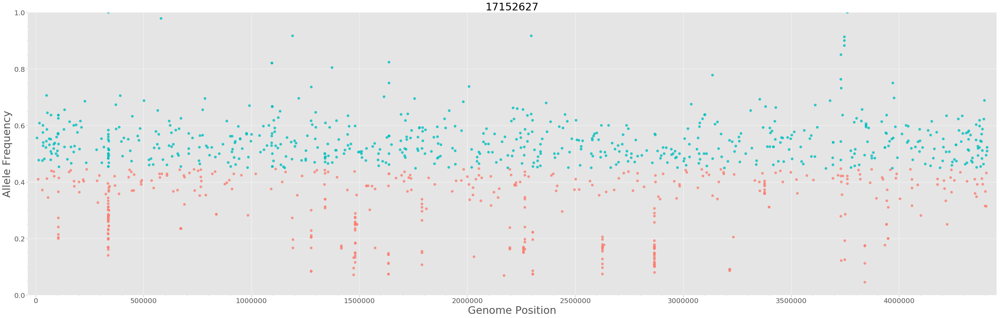

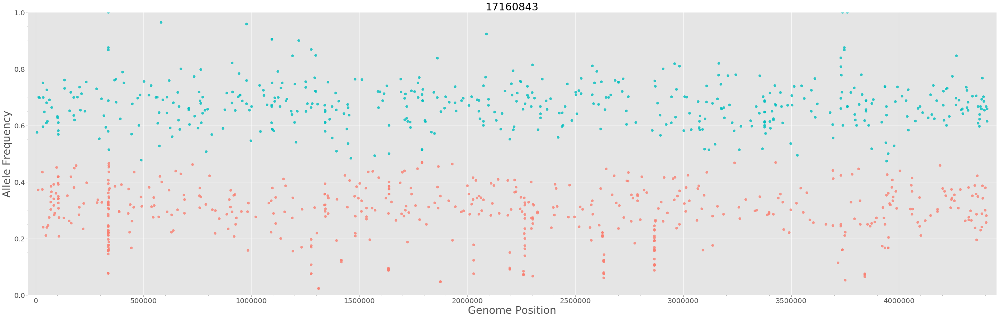

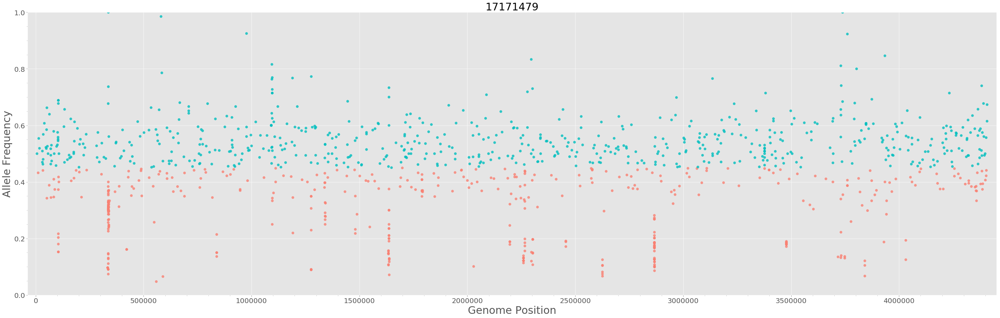

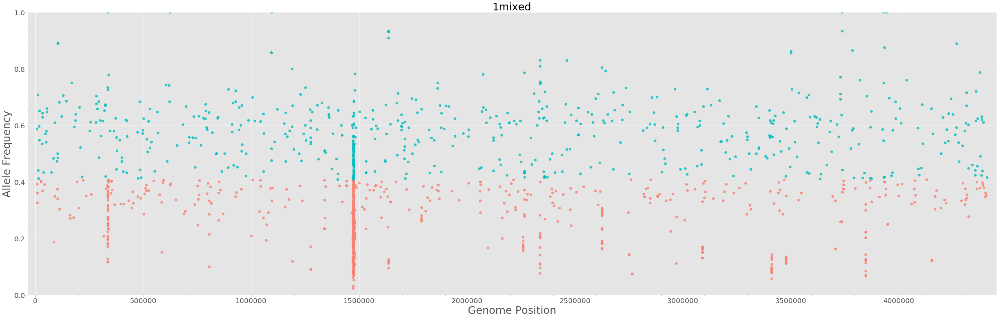

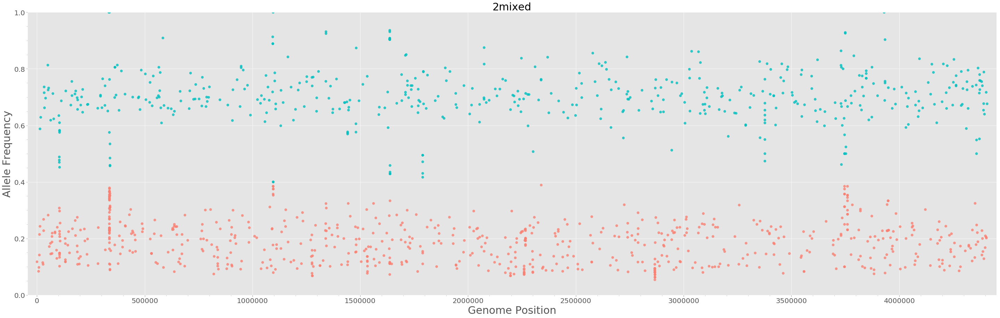

...

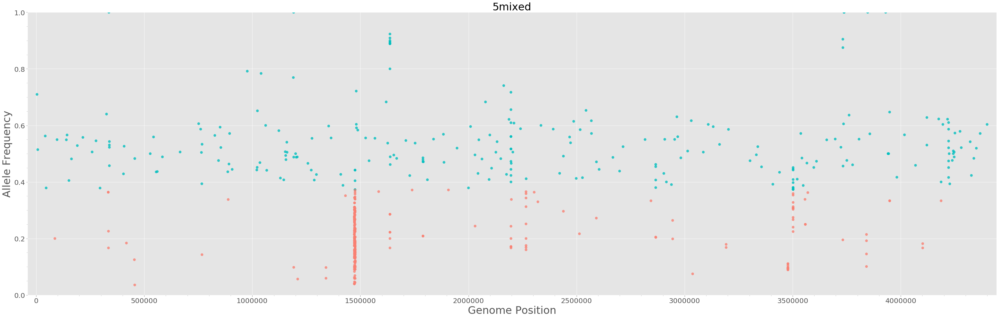

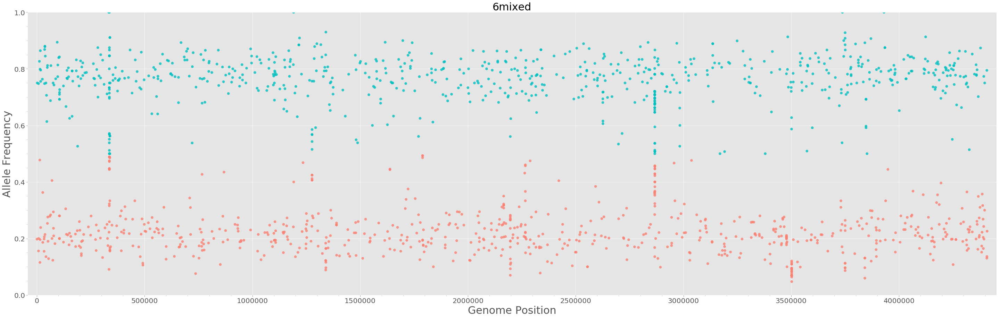

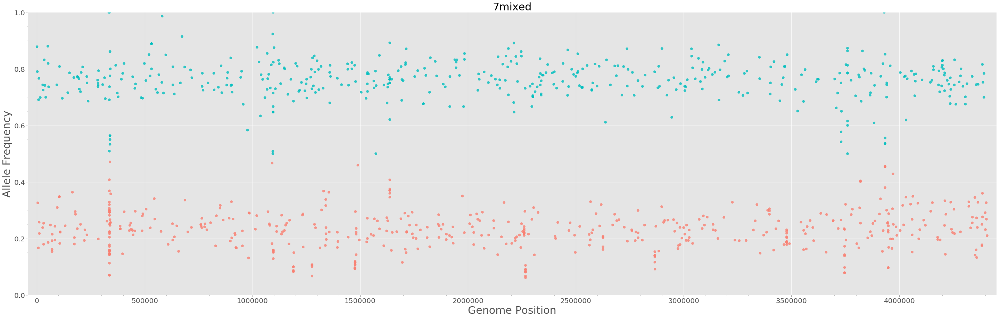

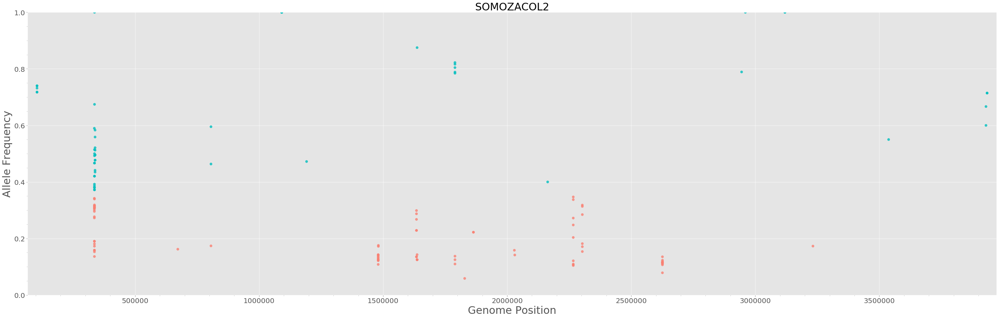

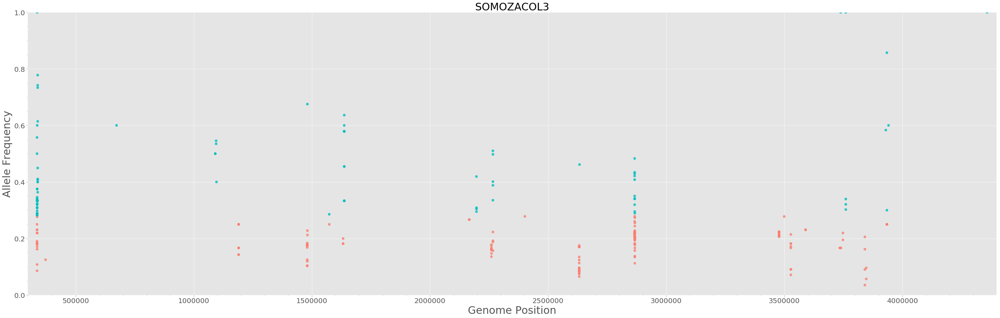

In [65]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

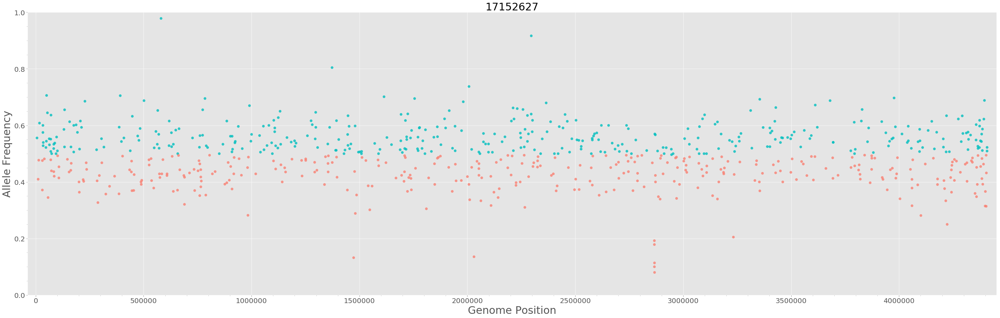

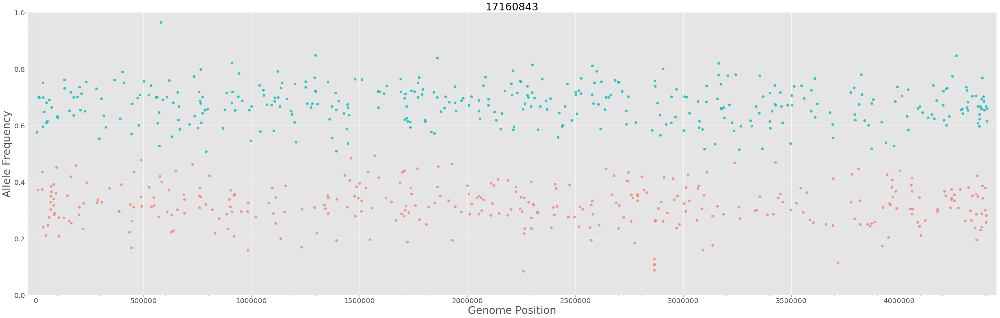

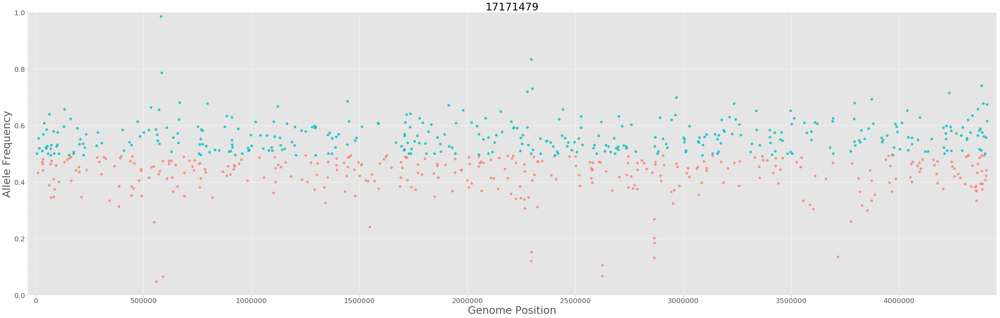

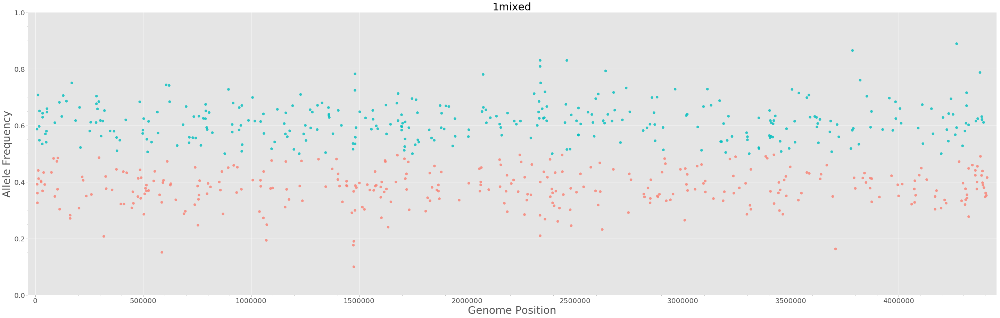

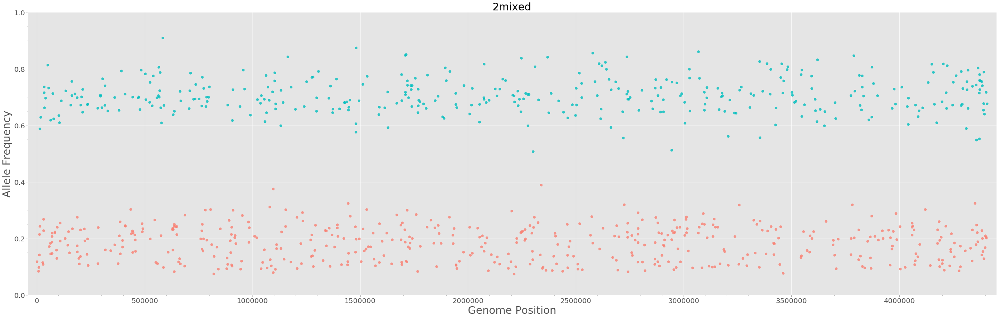

...

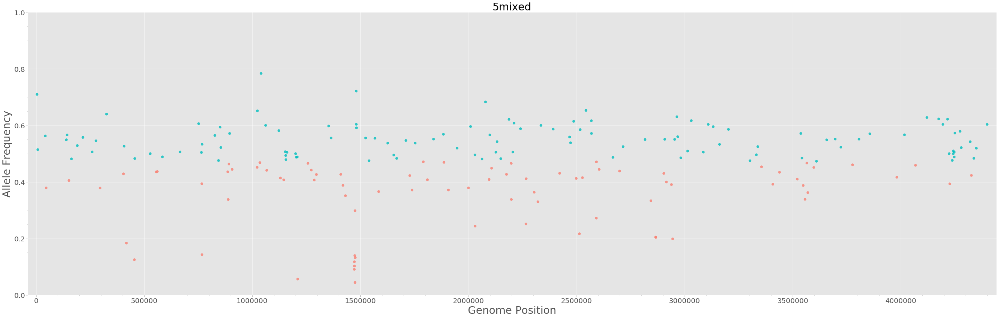

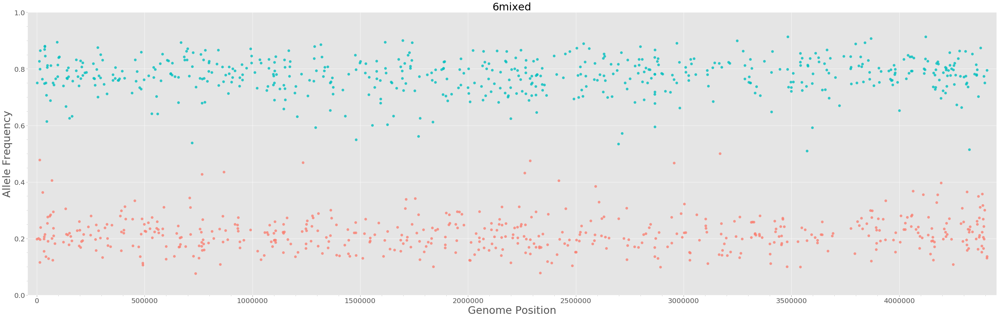

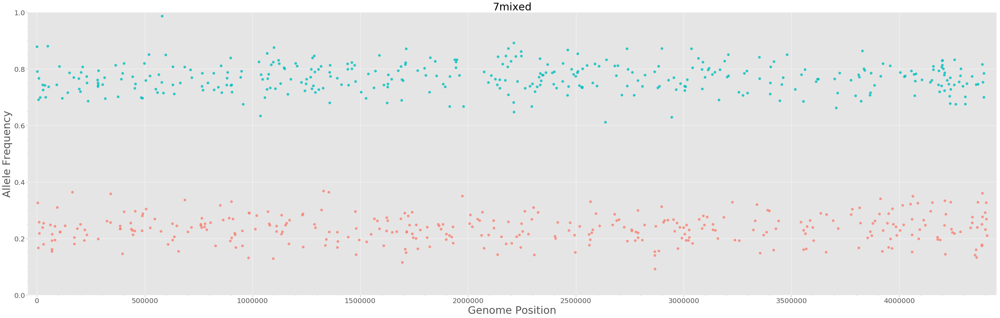

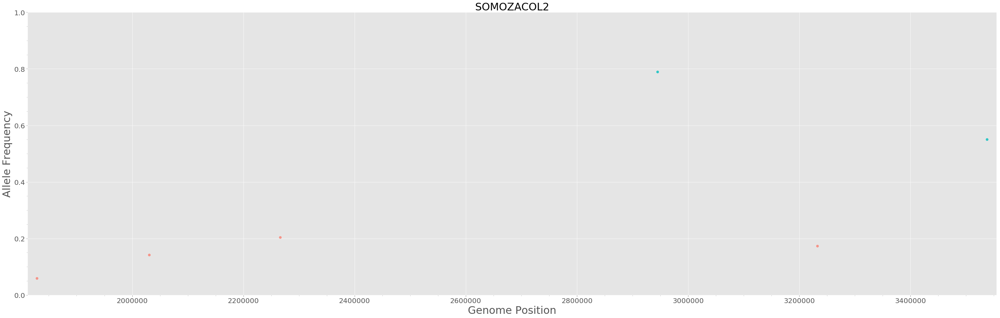

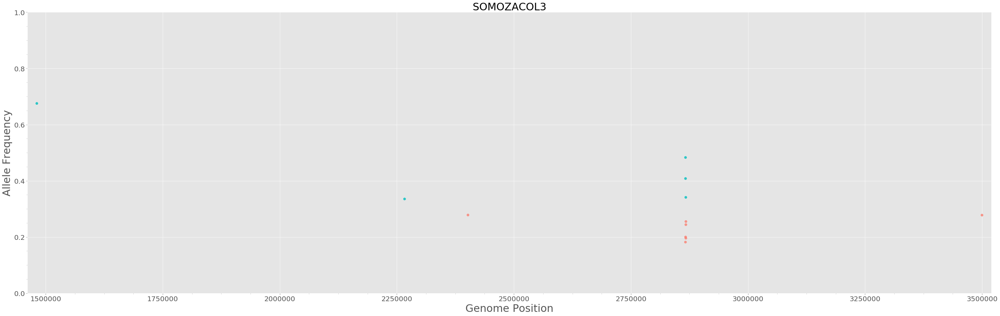

In [66]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

In [67]:
mix1 = dict_dff['1mixed']
mix1[(mix1.AF < 0.2)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
258,MTB_anc,586751,.,A,G,248.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.02;DP=86;Exc...,GT:AD:DP:GQ:PL,"0/1:73,13:86:99:269,0,1783",1.0,0.5,2.0,3.020,86.0,3.0103,1.155,-0.0046,60.00,0.000,2.89,-0.320,0.935,0/1,"73,13",99.0,"269,0,1783",NaN,NaN,NaN,2,73.0,13.0,0,1,86.0,0.848837,0.151163,False,860.0,4012.0,1
402,MTB_anc,1070318,.,G,C,134.43,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.242e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:25,6:31:99:0|1:1070318_G_C:154,0,985:1070318",1.0,0.5,2.0,-1.242,31.0,3.7163,3.632,-0.0301,60.00,0.000,2.74,0.771,1.426,0|1,"25,6",99.0,"154,0,985",0|1,1070318_G_C,1070318.0,2,25.0,6.0,0,1,31.0,0.806452,0.193548,False,6553.0,2358.0,1
670,MTB_anc,1473698,.,G,A,300.69,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-5.640e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:56,12:68:99:321,0,3157",1.0,0.5,2.0,-0.564,68.0,3.1274,1.223,-0.0131,58.36,-7.300,4.42,-2.286,0.440,0/1,"56,12",99.0,"321,0,3157",NaN,NaN,NaN,2,56.0,12.0,0,1,68.0,0.823529,0.176471,False,346.0,91.0,1
787,MTB_anc,1475699,.,C,T,5144.86,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.042e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:54,6:60:74:74,0,2071",1.0,0.5,2.0,-1.042,60.0,3.5721,0.564,-0.0346,59.55,-1.258,13.54,-1.240,0.620,0/1,"54,6",74.0,"74,0,2071",NaN,NaN,NaN,2,54.0,6.0,0,1,60.0,0.900000,0.100000,False,89.0,23.0,1
788,MTB_anc,1475722,.,G,T,377.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.110e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:81,19:100:99:259,0,3150",1.0,0.5,2.0,-1.110,100.0,3.2064,1.760,-0.0178,59.60,0.632,3.07,1.010,0.902,0/1,"81,19",99.0,"259,0,3150",NaN,NaN,NaN,2,81.0,19.0,0,1,100.0,0.810000,0.190000,False,23.0,29.0,1
1684,MTB_anc,3707476,.,G,C,138.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.883;DP=49;Ex...,GT:AD:DP:GQ:PL,"0/1:41,8:49:99:159,0,1142",1.0,0.5,2.0,0.883,49.0,3.0103,10.457,-0.0046,59.76,-5.824,2.82,-1.015,2.990,0/1,"41,8",99.0,"159,0,1142",NaN,NaN,NaN,2,41.0,8.0,0,1,49.0,0.836735,0.163265,False,9768.0,126.0,1


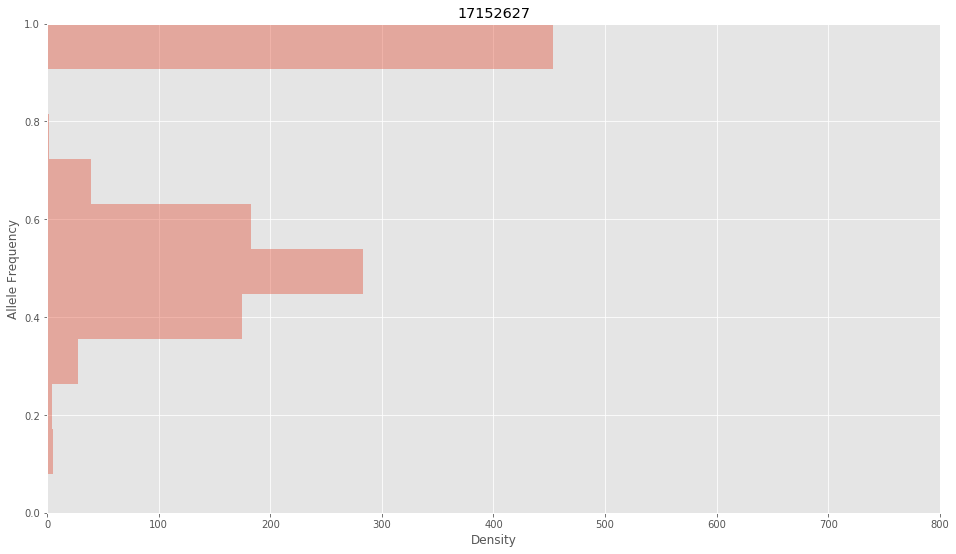

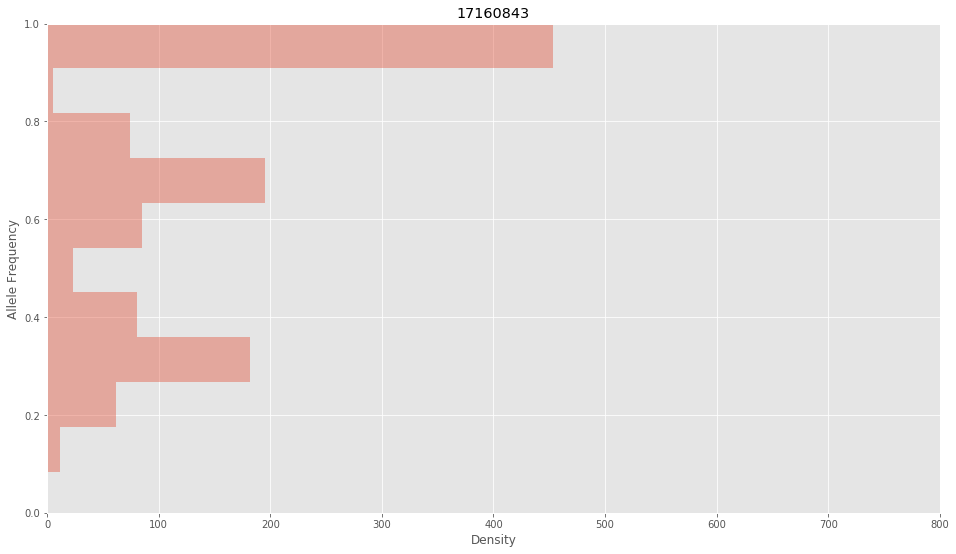

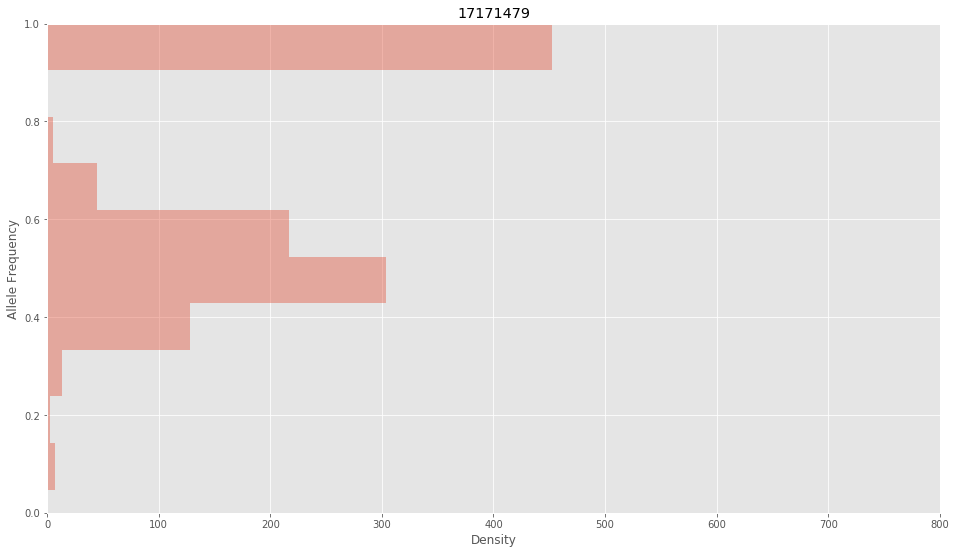

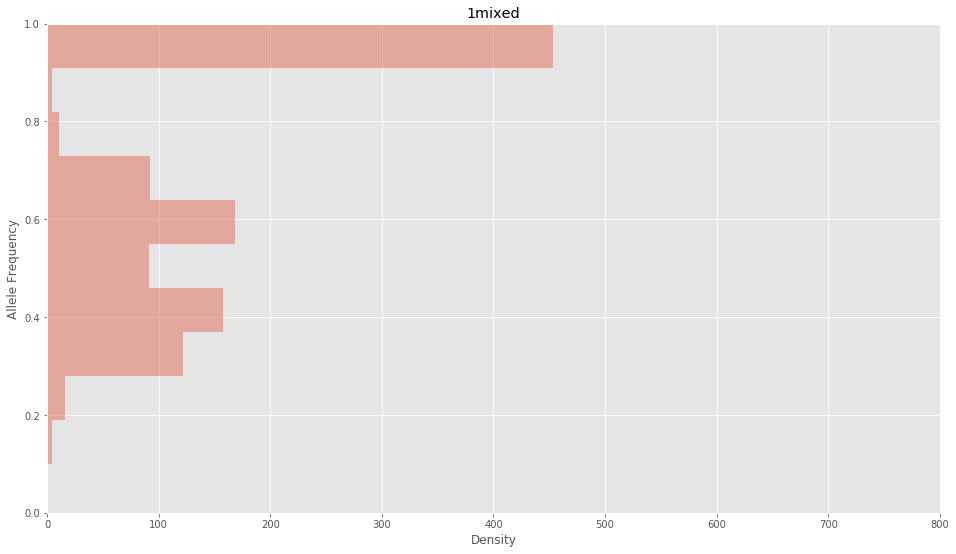

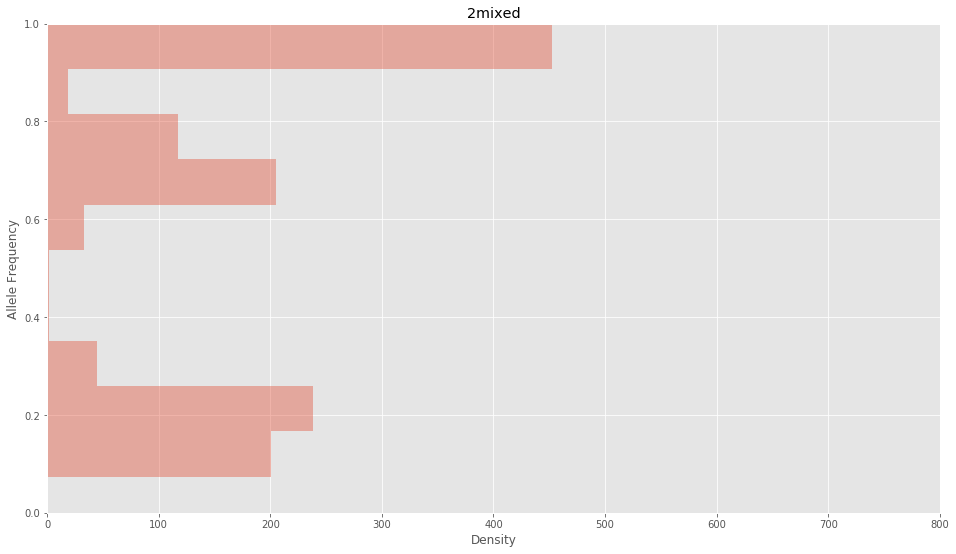

...

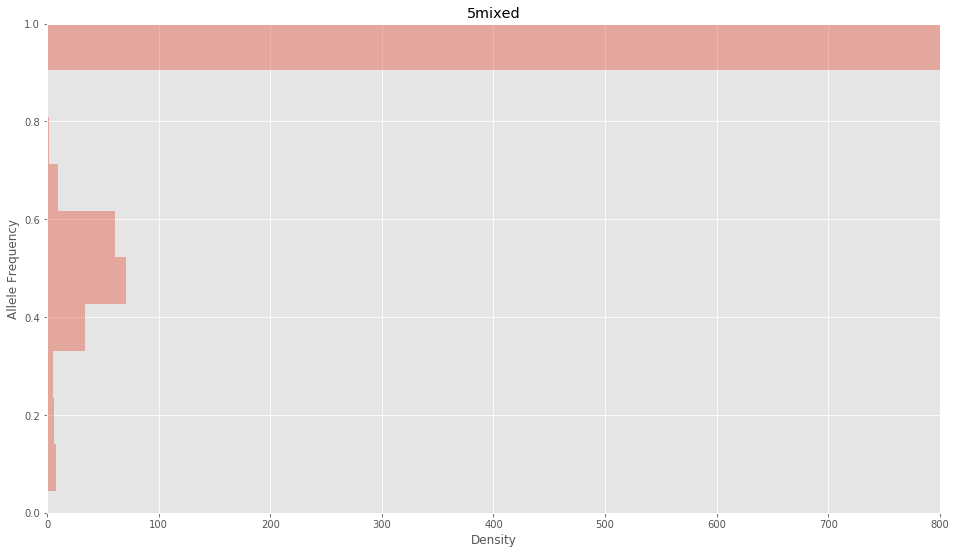

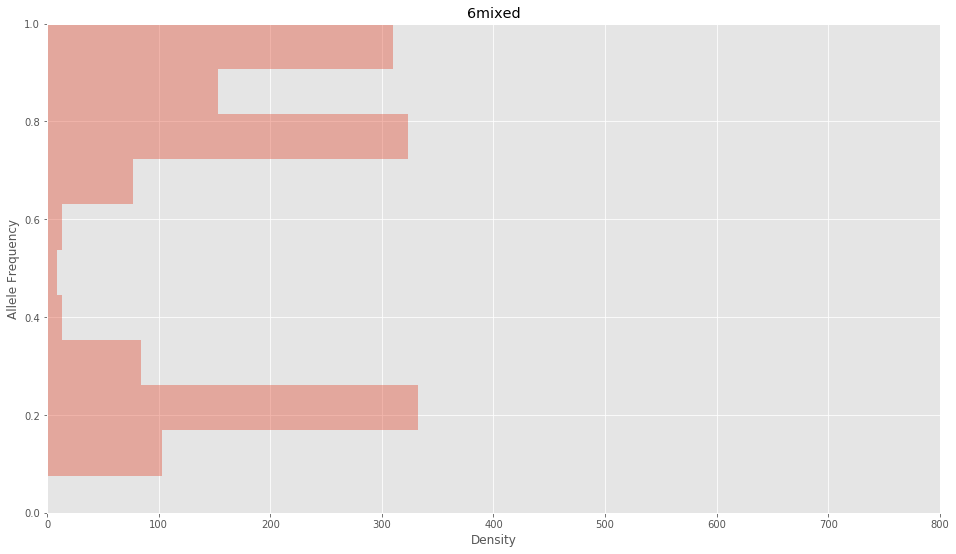

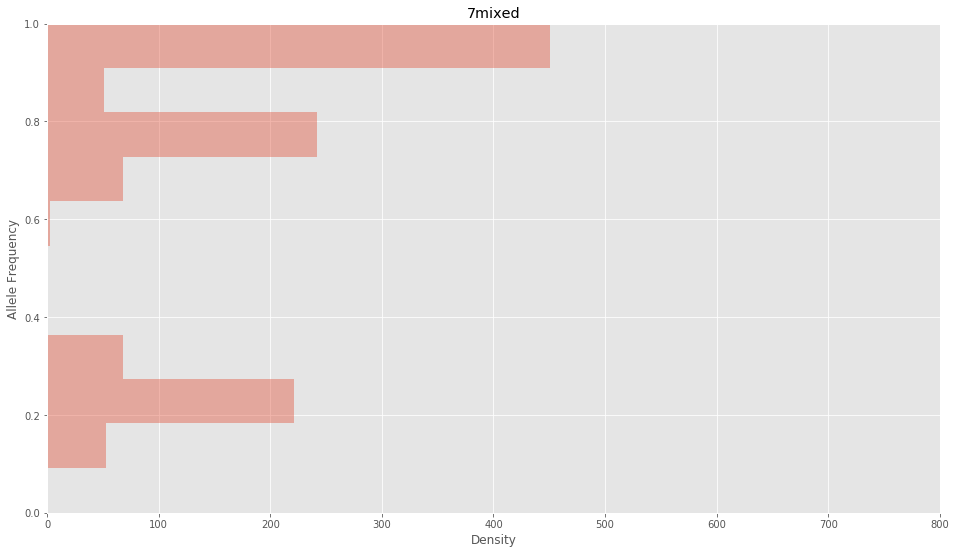

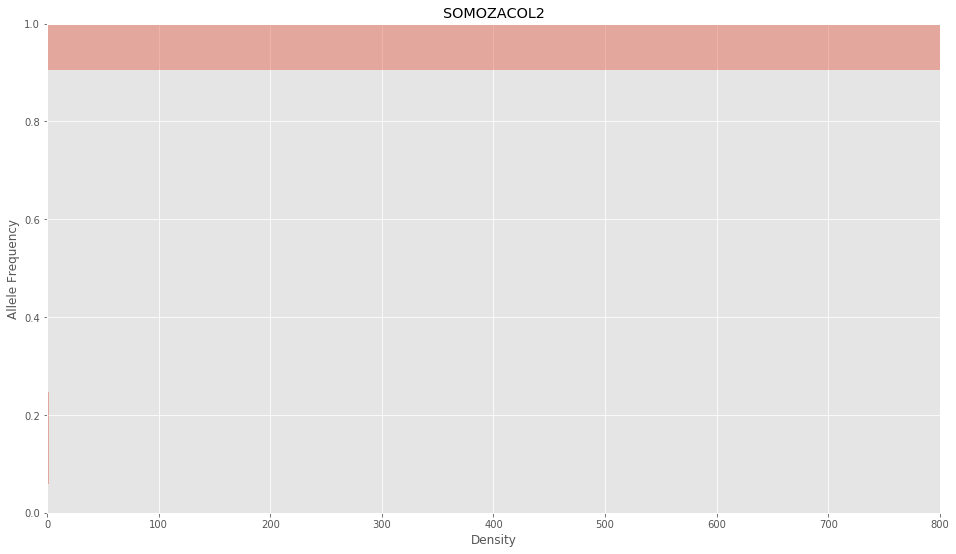

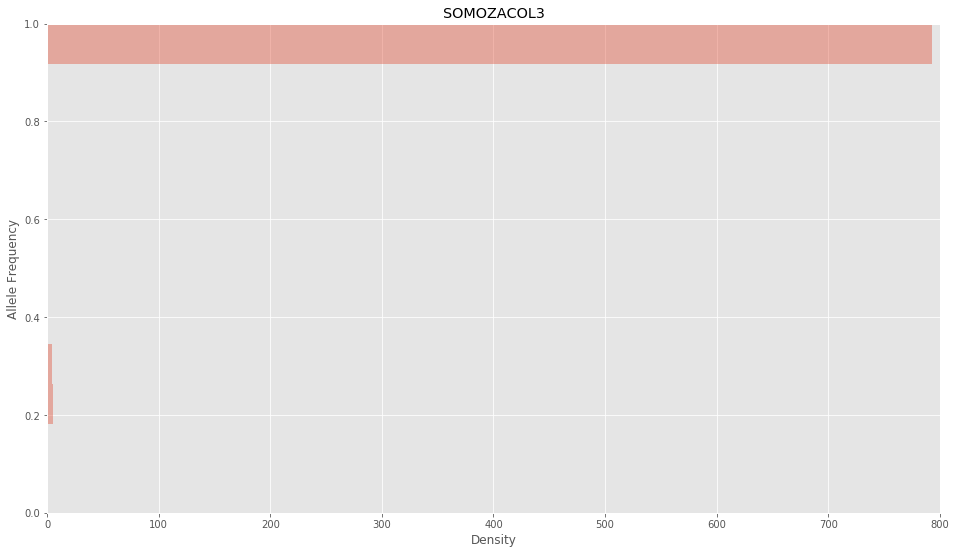

In [68]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [69]:
def split_df_mean(vcf_df):
    #filter_homoz_top = homoz
    #filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [70]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [71]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

17152627 368 353
17160843 373 347
17171479 373 351
1mixed 333 333
2mixed 377 486
3mixed 869 754
4mixed 113 95
5mixed 116 81
6mixed 571 537
7mixed 365 343
SOMOZACOL2 2 4
SOMOZACOL3 5 7


# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [73]:
dict_dff['1mixed'].describe()

,POS,QUAL,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GQ,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.119000e+03,1119.000000,1119.000000,1119.000000,1119.0,1116.000000,1119.000000,1119.000000,1119.000000,1119.000000,1119.000000,1116.000000,1119.000000,1116.000000,1119.000000,1119.000000,1.000000e+01,1119.0,1119.000000,1119.000000,1119.000000,1119.0,1119.000000,1119.000000,1119.000000,1119.000000,1119.000000,1119.0
mean,2.172297e+06,94228.285317,1.404826,0.702413,2.0,0.088472,96.470063,2.733355,1.661081,0.188247,59.821832,-0.002860,20.872100,0.197681,0.726951,98.278820,1.891840e+06,2.0,29.106345,67.296693,0.404826,1.0,96.403038,0.300007,0.699993,3422.532618,3400.453977,1.0
std,1.309419e+06,111797.984456,0.491078,0.245539,0.0,2.648295,29.646799,6.641119,3.130989,0.380013,1.510735,0.390293,10.674802,1.003398,0.252173,6.608325,1.300243e+06,0.0,29.021865,33.608361,0.491078,0.0,29.665506,0.268130,0.268130,3644.637748,3570.496509,0.0
min,2.532000e+03,35.850000,1.000000,0.500000,2.0,-6.575000,6.000000,-0.000000,0.000000,-0.930000,40.100000,-7.300000,2.560000,-3.272000,0.037000,11.000000,8.483000e+04,2.0,0.000000,2.000000,0.000000,1.0,6.000000,0.000000,0.100000,21.000000,21.000000,1.0
25%,1.056876e+06,992.420000,1.000000,0.500000,2.0,-2.138500,77.000000,3.010300,0.000000,-0.004600,60.000000,0.000000,10.530000,-0.413250,0.576000,99.000000,7.031585e+05,2.0,0.000000,41.000000,0.000000,1.0,77.000000,0.000000,0.444444,941.000000,951.000000,1.0
50%,2.151457e+06,2284.420000,1.000000,0.500000,2.0,0.920000,95.000000,3.010300,0.000000,-0.004600,60.000000,0.000000,18.560000,0.258500,0.701000,99.000000,2.303103e+06,2.0,29.000000,61.000000,0.000000,1.0,95.000000,0.359375,0.640625,2279.000000,2223.000000,1.0
75%,3.299330e+06,184343.090000,2.000000,1.000000,2.0,1.790000,115.000000,3.010300,2.047500,-0.004600,60.000000,0.000000,32.025000,0.879500,0.836000,99.000000,2.955443e+06,2.0,50.000000,90.000000,1.000000,1.0,115.000000,0.555556,1.000000,4711.500000,4686.000000,1.0
max,4.409602e+06,422301.940000,2.000000,1.000000,2.0,7.620000,214.000000,160.000000,44.079000,1.000000,60.000000,4.360000,37.690000,4.340000,2.990000,99.000000,3.537789e+06,2.0,151.000000,196.000000,1.000000,1.0,214.000000,0.900000,1.000000,25095.000000,21574.000000,1.0


In [74]:
def assign_group_1(row):
    if row.POS in dict_t_b['1mixed'][0]:
        return 1
    elif row.POS in dict_t_b['1mixed'][1]:
        return 2
    else:
        return 3
    
def assign_group_2(row):
    if row.POS in dict_t_b['2mixed'][0]:
        return 1
    elif row.POS in dict_t_b['2mixed'][1]:
        return 2
    else:
        return 3
    
def assign_group_3(row):
    if row.POS in dict_t_b['3mixed'][0]:
        return 1
    elif row.POS in dict_t_b['3mixed'][1]:
        return 2
    else:
        return 3
    
def assign_group_6(row):
    if row.POS in dict_t_b['6mixed'][0]:
        return 1
    elif row.POS in dict_t_b['6mixed'][1]:
        return 2
    else:
        return 3

def assign_group_7(row):
    if row.POS in dict_t_b['7mixed'][0]:
        return 1
    elif row.POS in dict_t_b['7mixed'][1]:
        return 2
    else:
        return 3
    
def assign_group_somoza(row):
    if row.POS in S2_exclusive:
        return 1
    elif row.POS in S3_exclusive:
        return 2
    else:
        return 3

In [75]:
S2 = set(dict_dff['SOMOZACOL2'].POS.values)
S3 = set(dict_dff['SOMOZACOL3'].POS.values)

S3_exclusive = S3 - S2
S2_exclusive = S2 - S3
Shared_2_3 = S2 & S3
total_difference_2_3 = (len(S2_exclusive) + len(S3_exclusive))
print("S2 has %s unique positions\n\
S3 has %s unique positions\n\
Both share %s positions\n\
Total difference: %s" % (len(S2_exclusive) , len(S3_exclusive), len(Shared_2_3),total_difference_2_3 ))

S2 has 385 unique positions
S3 has 358 unique positions
Both share 447 positions
Total difference: 743


In [76]:
Ktest1 = dict_dff['1mixed'][(dict_dff['1mixed'].AC != 2)]
Ktest2 = dict_dff['2mixed'][(dict_dff['2mixed'].AC != 2)]
Ktest3 = dict_dff['3mixed'][(dict_dff['3mixed'].AC != 2)]
Ktest6 = dict_dff['6mixed'][(dict_dff['6mixed'].AC != 2)]
Ktest7 = dict_dff['7mixed'][(dict_dff['7mixed'].AC != 2)]

Ktest15 = dict_dff['17152627'][(dict_dff['17152627'].AC != 2) & (dict_dff['17152627'].gt0 != 1)]
Ktest16 = dict_dff['17160843'][(dict_dff['17160843'].AC != 2) & (dict_dff['17160843'].gt0 != 1)]
Ktest17 = dict_dff['17171479'][(dict_dff['17171479'].AC != 2) & (dict_dff['17171479'].gt0 != 1)]

In [77]:
Ktest1['category'] = Ktest1.apply(assign_group_1, axis=1)
Ktest2['category'] = Ktest2.apply(assign_group_2, axis=1)
Ktest3['category'] = Ktest3.apply(assign_group_3, axis=1)
Ktest6['category'] = Ktest6.apply(assign_group_6, axis=1)
Ktest7['category'] = Ktest7.apply(assign_group_7, axis=1)

Ktest15['category'] = Ktest15.apply(assign_group_somoza, axis=1)
Ktest16['category'] = Ktest16.apply(assign_group_somoza, axis=1)
Ktest17['category'] = Ktest17.apply(assign_group_somoza, axis=1)

/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [78]:
Ktest15 = Ktest15[Ktest15.category != 3]
Ktest16 = Ktest16[Ktest16.category != 3]
Ktest17 = Ktest17[Ktest17.category != 3]

/home/laura/env36/lib/python3.6/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


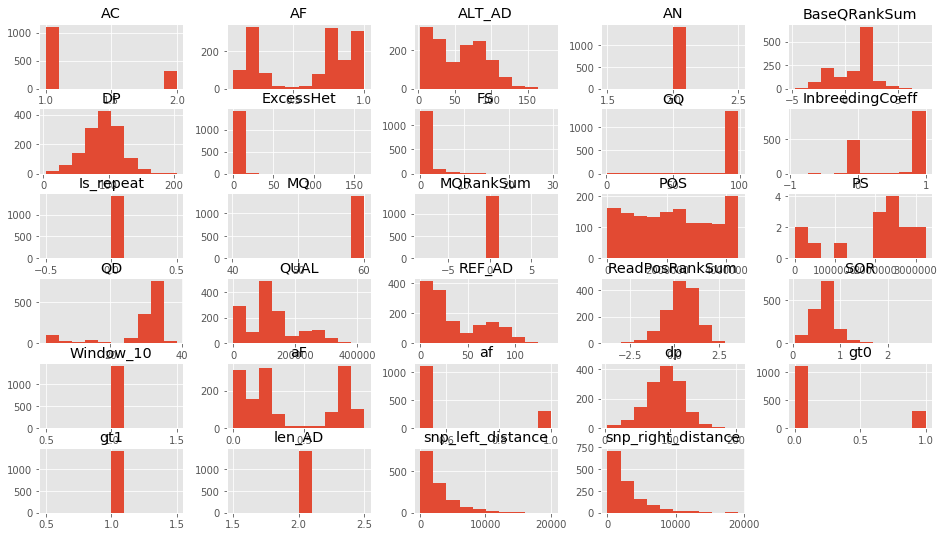

In [79]:
dict_dff['6mixed'].hist()
plt.show()

In [80]:
Ktest6.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
0,MTB_anc,698,.,G,A,321.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.330e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:69,17:86:99:342,0,2078",1.0,0.5,2.0,-0.633,86.0,3.0103,2.236,-0.0046,60.0,0.0,3.74,1.380,1.025,0/1,"69,17",99.0,"342,0,2078",NaN,NaN,NaN,2,69.0,17.0,0,1,86.0,0.802326,0.197674,False,698.0,1151.0,1,2
1,MTB_anc,1849,.,C,A,103418.71,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.77;DP=88;Exc...,GT:AD:DP:GQ:PL,"0/1:22,66:88:99:1711,0,400",1.0,0.5,2.0,1.770,88.0,-0.0000,0.000,0.9811,60.0,0.0,31.75,0.775,0.365,0/1,"22,66",99.0,"1711,0,400",NaN,NaN,NaN,2,22.0,66.0,0,1,88.0,0.250000,0.750000,False,1151.0,683.0,1,1
5,MTB_anc,8040,.,G,A,31813.37,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.360e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:72,18:90:99:276,0,1936",1.0,0.5,2.0,-0.736,90.0,0.0000,0.000,0.9424,60.0,0.0,30.07,-0.469,0.578,0/1,"72,18",99.0,"276,0,1936",NaN,NaN,NaN,2,72.0,18.0,0,1,90.0,0.800000,0.200000,False,458.0,1103.0,1,2
7,MTB_anc,11820,.,C,G,123654.17,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.76;DP=98;Exc...,GT:AD:DP:GQ:PL,"0/1:17,81:98:99:2328,0,307",1.0,0.5,2.0,1.760,98.0,0.0000,0.000,0.9811,60.0,0.0,34.95,1.490,0.435,0/1,"17,81",99.0,"2328,0,307",NaN,NaN,NaN,2,17.0,81.0,0,1,98.0,0.173469,0.826531,False,2677.0,1640.0,1,1
9,MTB_anc,13638,.,T,C,1467.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.41;DP=111;Ex...,GT:AD:DP:GQ:PL,"0/1:58,53:111:99:1488,0,1407",1.0,0.5,2.0,3.410,111.0,3.0103,0.000,-0.0046,60.0,0.0,13.22,1.450,0.700,0/1,"58,53",99.0,"1488,0,1407",NaN,NaN,NaN,2,58.0,53.0,0,1,111.0,0.522523,0.477477,False,178.0,613.0,1,2


In [81]:
Ktest1[Ktest1.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category


In [82]:
Ktest6[Ktest6.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category


/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


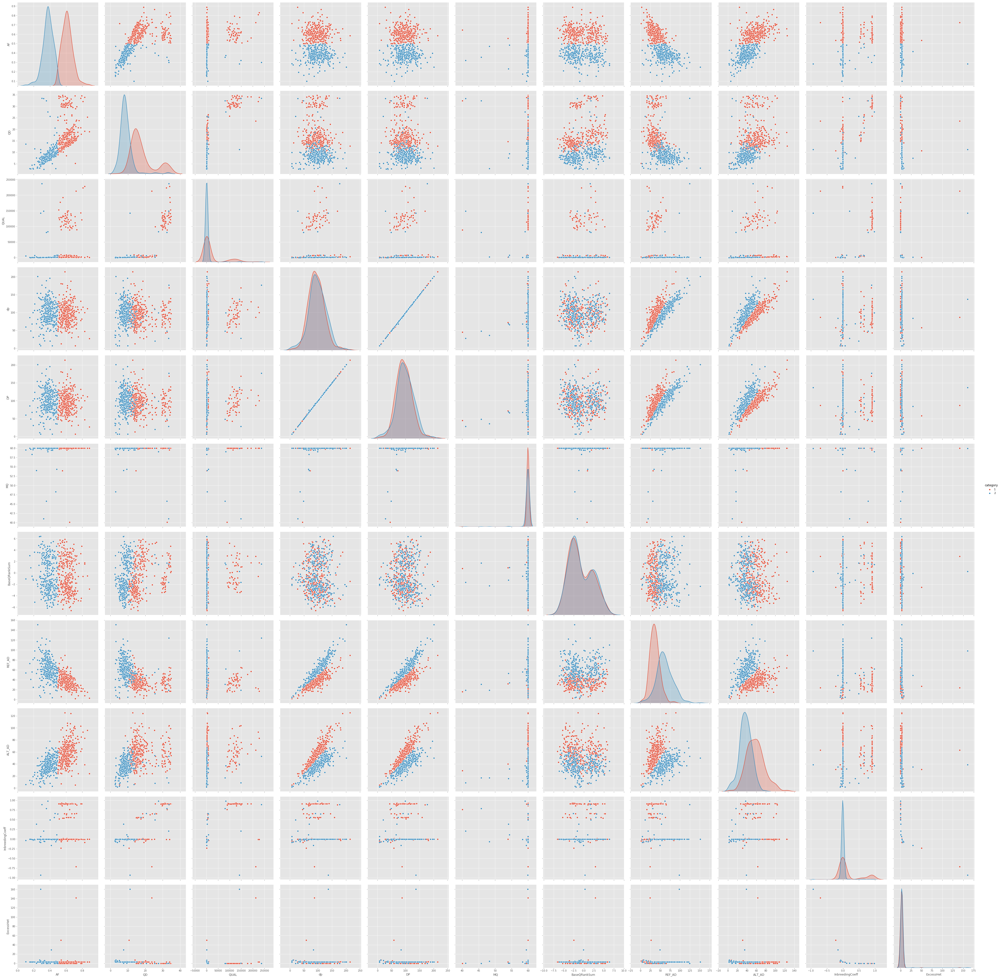

In [83]:
sns.pairplot(Ktest1, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

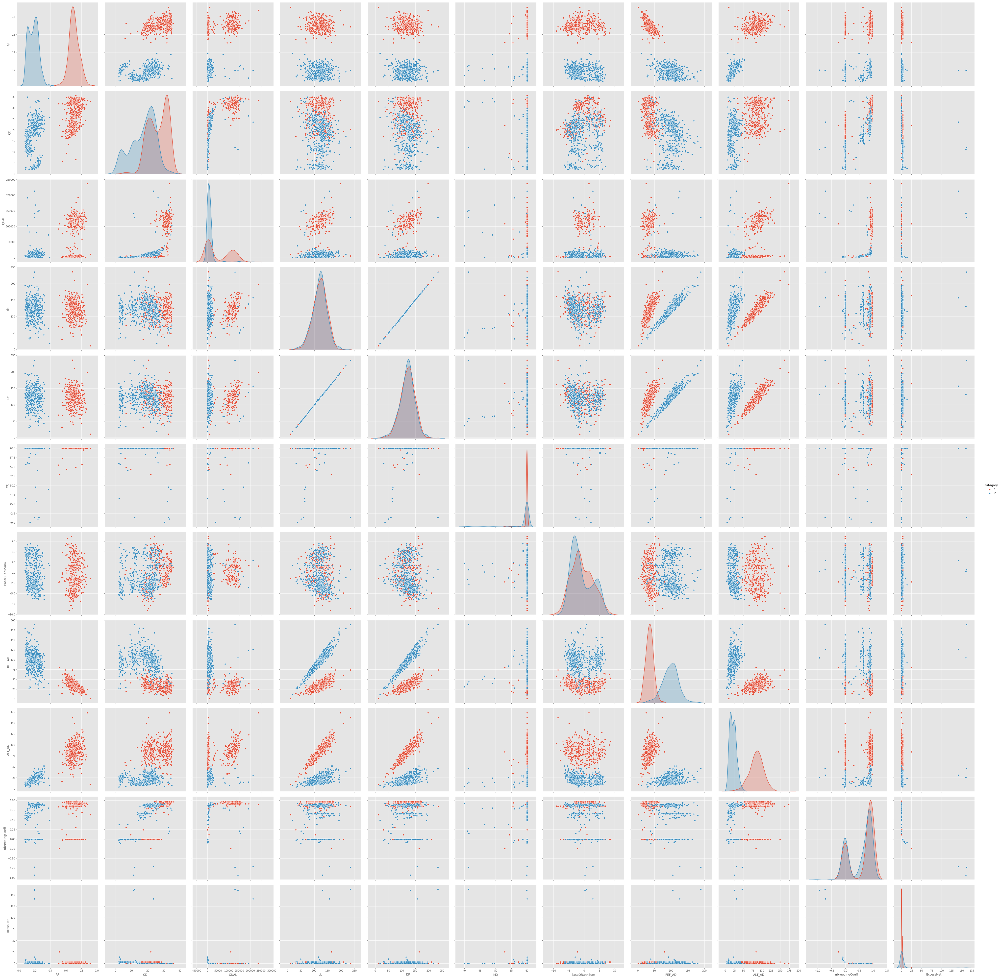

In [84]:
sns.pairplot(Ktest2, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

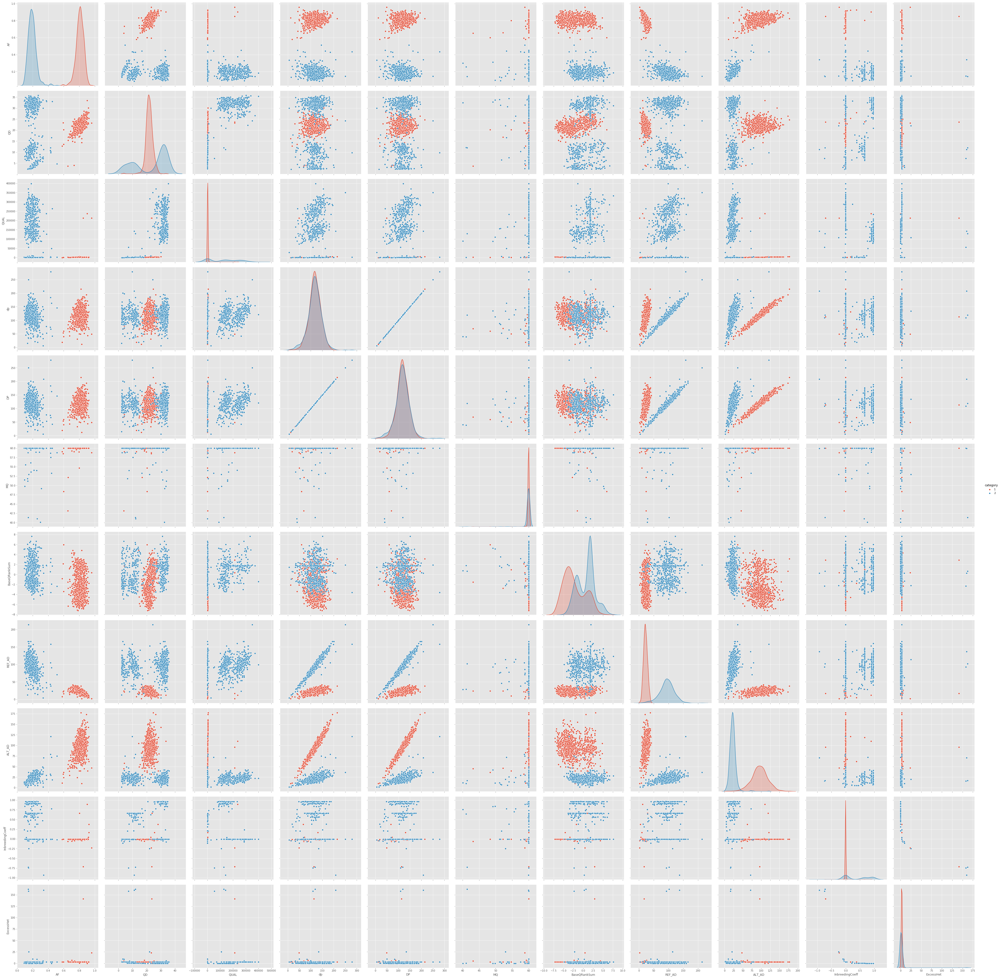

In [85]:
sns.pairplot(Ktest3, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

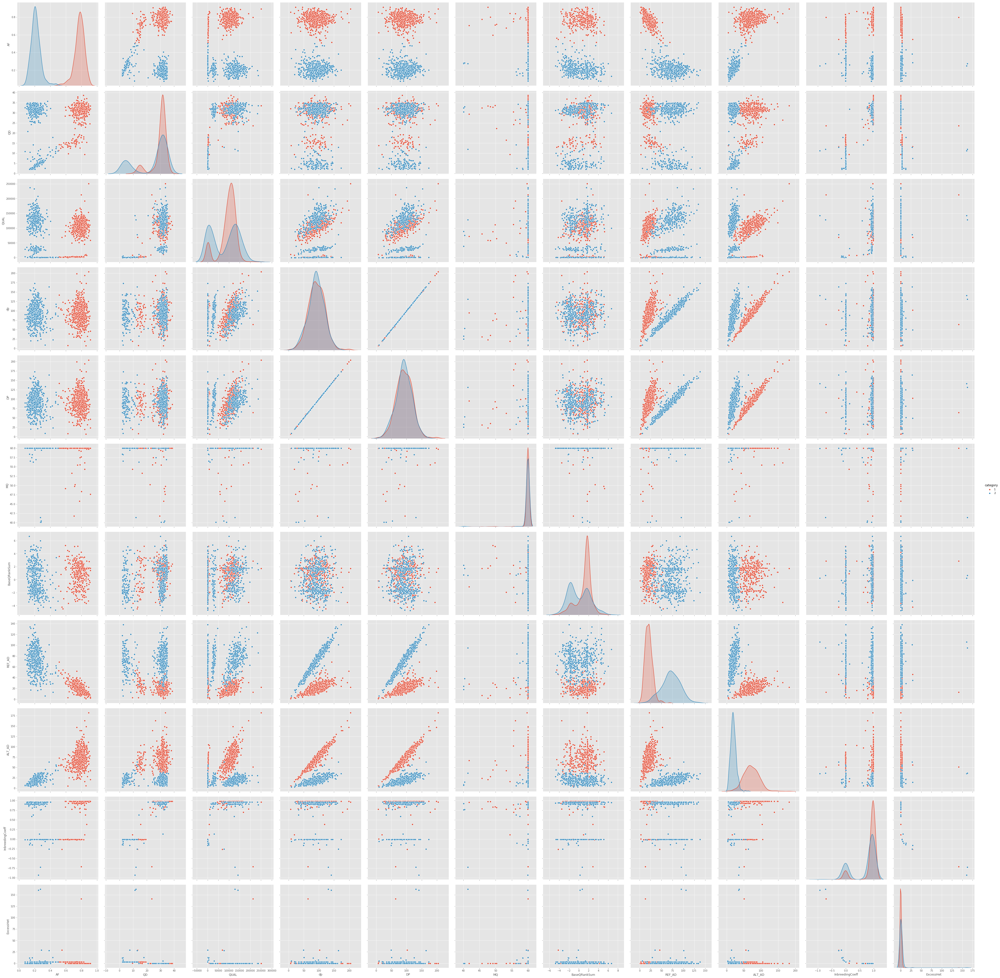

In [86]:
sns.pairplot(Ktest6, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

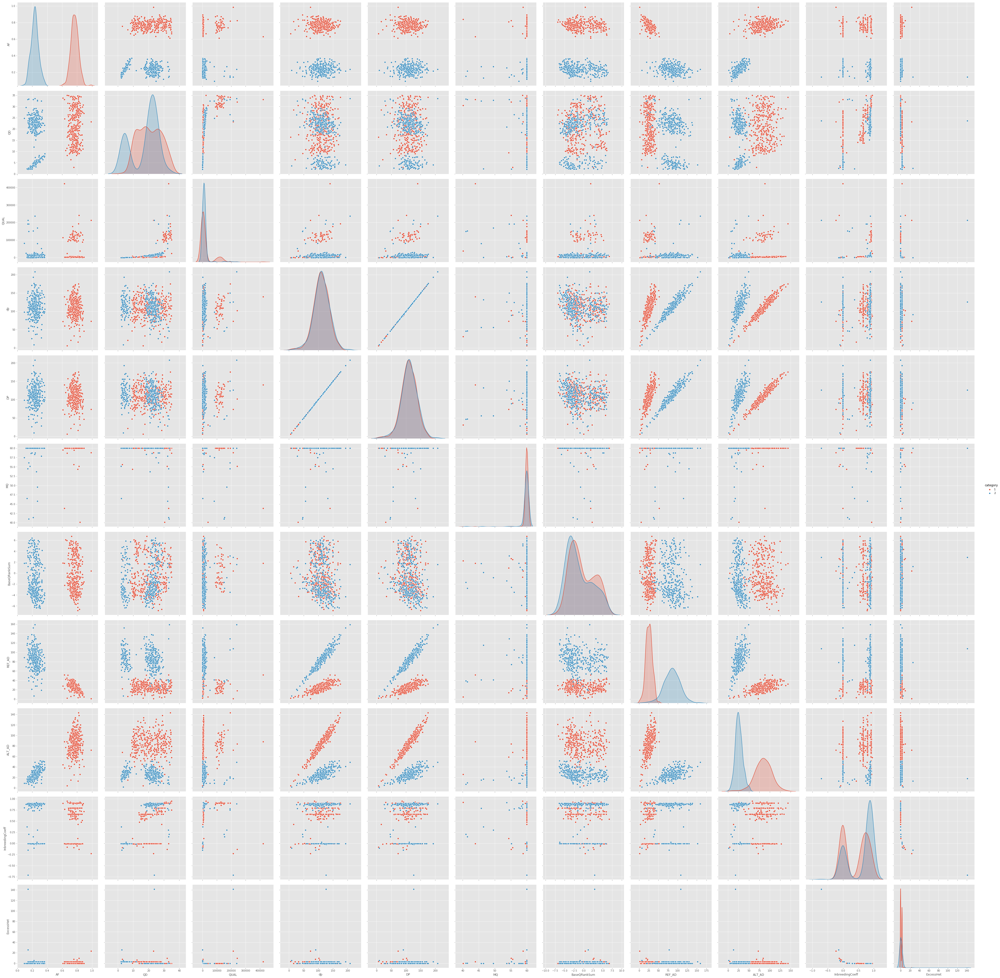

In [87]:
sns.pairplot(Ktest7, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

# Feature Importance
---
---

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


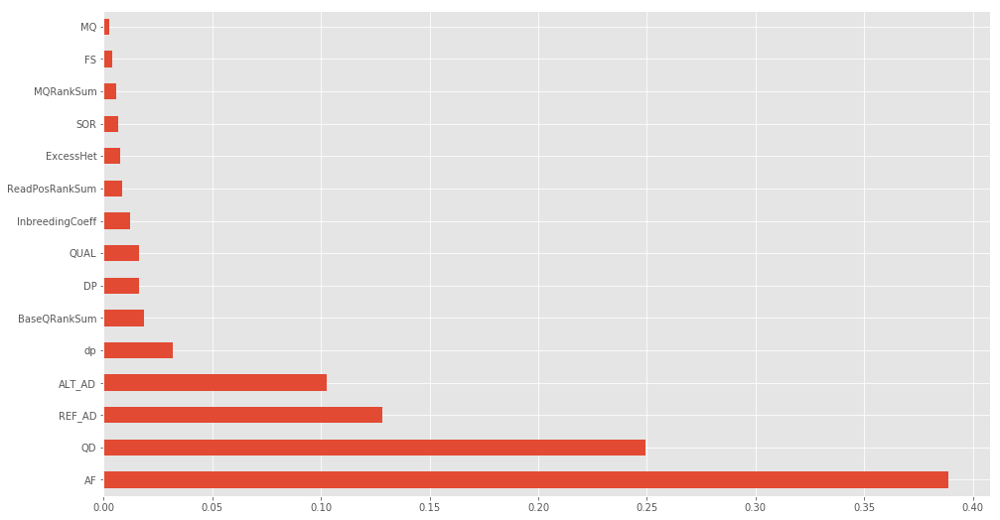

In [88]:
X = Ktest1[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest1['category']    #target column i.e price range

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


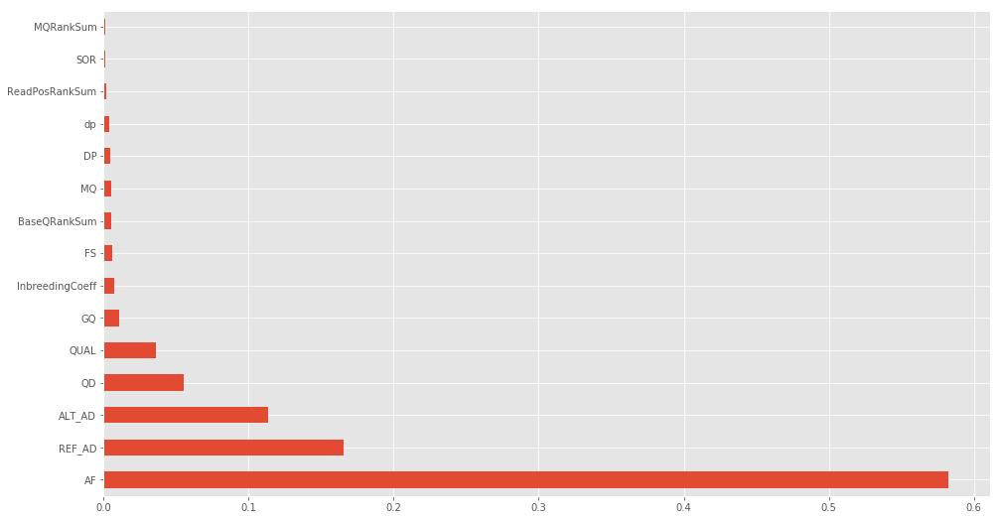

In [89]:
X = Ktest2[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest2['category']    #target column i.e price range

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


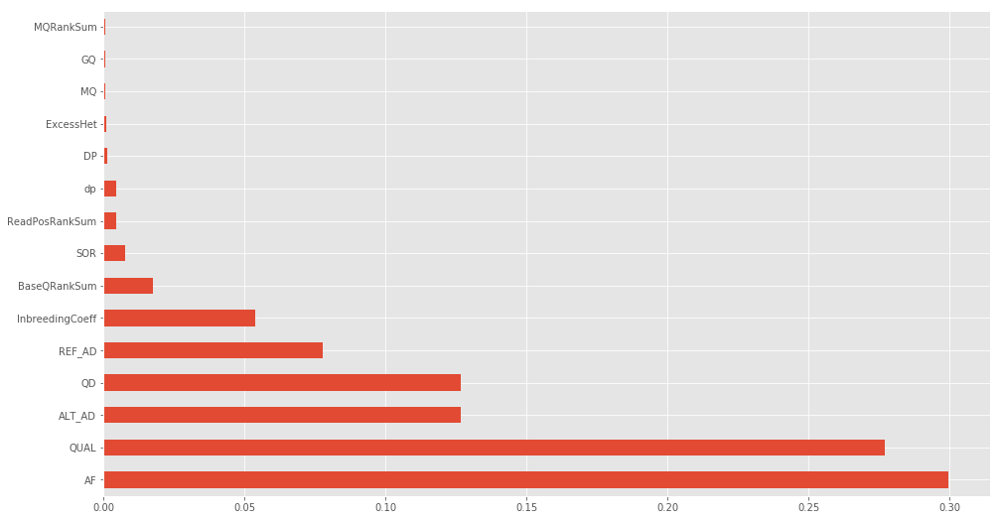

In [90]:
X = Ktest3[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest3['category']    #target column i.e price range

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


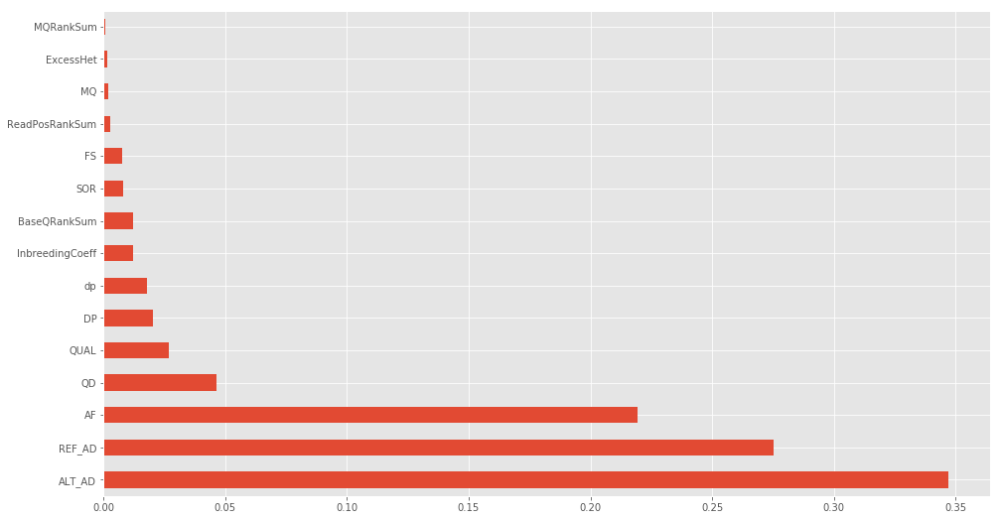

In [91]:
X = Ktest6[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest6['category']    #target column i.e price range

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


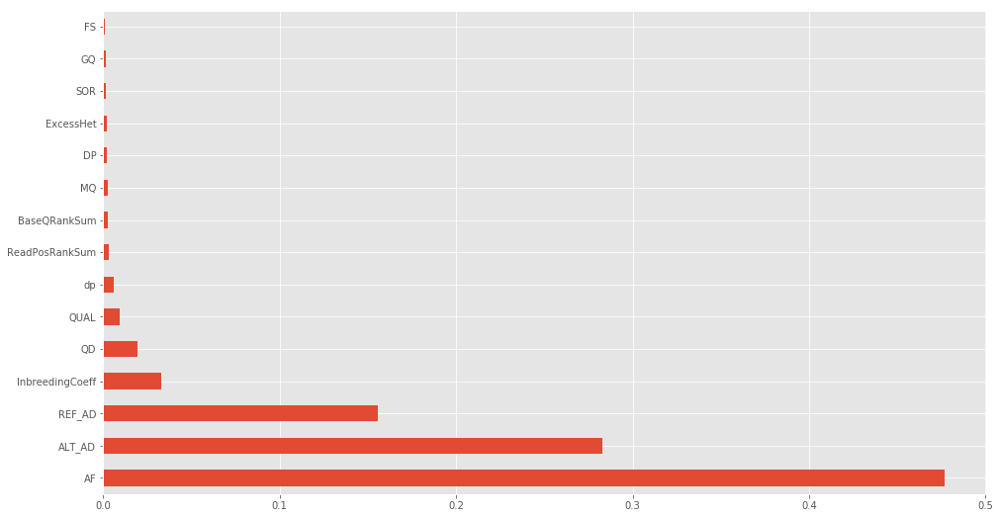

In [92]:
X = Ktest7[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest7['category']    #target column i.e price range

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

# Ensemble Learning Model 

https://towardsdatascience.com/ensemble-learning-using-scikit-learn-85c4531ff86a

In [93]:
## Split up the dataset into inputs and targets
X = Ktest15[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y = Ktest15['category']    #target column i.e price range

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

- ### Random Forest

In [95]:
#create a new random forest classifier
rf = RandomForestClassifier()
#create a dictionary of all values we want to test for n_estimators
params_rf = {'n_estimators': [100, 200, 400]}
#use gridsearch to test all values for n_estimators
rf_gs = GridSearchCV(rf, params_rf, cv=5)
#fit model to training data
rf_gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [100, 200, 400]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [96]:
#save best model
rf_best = rf_gs.best_estimator_
#check best n_estimators value
print(rf_gs.best_params_)

{'n_estimators': 200}


In [97]:
rf_gs.score(X_test, y_test)

0.9583333333333334

In [98]:
X16 = Ktest16[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y16 = Ktest16['category']    #target column i.e price range

rf_gs.score(X16,y16)

0.9929971988795518

In [99]:
X17 = Ktest17[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y17 = Ktest17['category']    #target column i.e price range

rf_gs.score(X17,y17)

0.9762569832402235

In [100]:
X1 = Ktest1[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y1 = Ktest1['category']    #target column i.e price range

rf_gs.score(X1,y1)

0.6396396396396397

In [101]:
X2 = Ktest2[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y2 = Ktest2['category']    #target column i.e price range

rf_gs.score(X2,y2)

0.6628041714947857

In [102]:
X3 = Ktest3[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y3 = Ktest3['category']    #target column i.e price range

rf_gs.score(X3,y3)

0.669747381392483

In [103]:
X6 = Ktest6[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y6 = Ktest6['category']    #target column i.e price range

rf_gs.score(X6,y6)

0.5478339350180506

In [104]:
X7 = Ktest7[["QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", 
            "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD",
            "InbreedingCoeff"]]  #independent columns
y7 = Ktest7['category']    #target column i.e price range

rf_gs.score(X7,y7)

0.7076271186440678